In [146]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import main as main
from tabulate import tabulate
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.cluster import KMeans 

In [147]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Part 1. Prediction with data from other sources

## Data Preperation

### *Pickups Data*

In [71]:
data = pd.read_csv('BikeSharing_Bluebikes2022.csv', index_col=0)

/home/georgep/anaconda3/envs/MachineLearning/lib/python3.8/site-packages/numpy/lib/arraysetops.py:580: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



In [4]:
data.head()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,postal code
0,597,2022-01-01 00:00:25.1660,2022-01-01 00:10:22.1920,178,MIT Pacific St at Purrington St,42.359573,-71.101295,74,Harvard Square at Mass Ave/ Dunster,42.373268,-71.118579,4923,Subscriber,02139
1,411,2022-01-01 00:00:40.4300,2022-01-01 00:07:32.1980,189,Kendall T,42.362428,-71.084955,178,MIT Pacific St at Purrington St,42.359573,-71.101295,3112,Subscriber,02139
2,476,2022-01-01 00:00:54.8180,2022-01-01 00:08:51.6680,94,Main St at Austin St,42.375603,-71.064608,356,Charlestown Navy Yard,42.374125,-71.054812,6901,Customer,02124
3,466,2022-01-01 00:01:01.6080,2022-01-01 00:08:48.2350,94,Main St at Austin St,42.375603,-71.064608,356,Charlestown Navy Yard,42.374125,-71.054812,5214,Customer,02124
4,752,2022-01-01 00:01:06.0520,2022-01-01 00:13:38.2300,19,Park Dr at Buswell St,42.347241,-71.105301,41,Packard's Corner - Commonwealth Ave at Brighto...,42.352261,-71.123831,2214,Subscriber,02215


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2305735 entries, 0 to 487200
Data columns (total 14 columns):
 #   Column                   Dtype  
---  ------                   -----  
 0   tripduration             int64  
 1   starttime                object 
 2   stoptime                 object 
 3   start station id         int64  
 4   start station name       object 
 5   start station latitude   float64
 6   start station longitude  float64
 7   end station id           int64  
 8   end station name         object 
 9   end station latitude     float64
 10  end station longitude    float64
 11  bikeid                   int64  
 12  usertype                 object 
 13  postal code              object 
dtypes: float64(4), int64(4), object(6)
memory usage: 263.9+ MB


In [77]:
#transforming the dates from object to datetime
for date_column in ['starttime','stoptime']:
    data[date_column] = pd.to_datetime(data[date_column], format='%Y-%m-%d %H:%M:%S')

In [221]:
df15 = main.DatetimeInterval(data, freq='15Min')
df30 = main.DatetimeInterval(data, freq='30Min')
df60 = main.DatetimeInterval(data, freq='60Min')
df120 = main.DatetimeInterval(data, freq='120Min')

In [222]:
df15.head()

,usertype_Customer,usertype_Subscriber,pickups
starttime,,,
2022-01-01 00:00:00,7.0,23.0,30.0
2022-01-01 00:15:00,6.0,30.0,36.0
2022-01-01 00:30:00,7.0,22.0,29.0
2022-01-01 00:45:00,8.0,22.0,30.0
2022-01-01 01:00:00,5.0,16.0,21.0


### *Weather Data*

In [345]:
weather_data = pd.read_csv('Data/WeatherData', index_col=0)

In [346]:
weather_data.head()

,name,datetime,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,...,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations
0,Boston,2022-01-01T00:00:00,7.8,7.8,6.7,92.50,0.0,0,NaN,0.0,...,1014.5,100.0,8.0,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."
1,Boston,2022-01-01T01:00:00,7.2,6.5,6.7,96.49,0.0,0,NaN,0.0,...,1014.1,100.0,5.1,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."
2,Boston,2022-01-01T02:00:00,7.2,6.0,6.7,96.49,0.0,0,NaN,0.0,...,1014.2,100.0,4.0,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."
3,Boston,2022-01-01T03:00:00,7.2,7.2,6.7,96.60,0.0,0,NaN,0.0,...,1014.1,100.0,1.0,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."
4,Boston,2022-01-01T04:00:00,6.8,5.4,6.7,99.79,0.0,0,NaN,0.0,...,1013.6,100.0,0.0,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."


In [347]:
weather_data['datetime'] = pd.to_datetime(weather_data['datetime'], format='%Y-%m-%dT%H:%M:%S')
weather_data.drop('name',axis=1, inplace=True)
weather_data.set_index('datetime', inplace=True)

In [348]:
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5831 entries, 2022-01-01 00:00:00 to 2022-08-31 23:00:00
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   temp              5831 non-null   float64
 1   feelslike         5831 non-null   float64
 2   dew               5831 non-null   float64
 3   humidity          5831 non-null   float64
 4   precip            5831 non-null   float64
 5   precipprob        5831 non-null   int64  
 6   preciptype        547 non-null    object 
 7   snow              5831 non-null   float64
 8   snowdepth         5831 non-null   float64
 9   windgust          5675 non-null   float64
 10  windspeed         5831 non-null   float64
 11  winddir           5831 non-null   float64
 12  sealevelpressure  5831 non-null   float64
 13  cloudcover        5831 non-null   float64
 14  visibility        5831 non-null   float64
 15  solarradiation    5691 non-null   float64
 16  solare

In [349]:
weather_data.head()

,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windgust,...,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations
datetime,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,7.8,7.8,6.7,92.50,0.0,0,NaN,0.0,0.0,NaN,...,1014.5,100.0,8.0,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."
2022-01-01 01:00:00,7.2,6.5,6.7,96.49,0.0,0,NaN,0.0,0.0,NaN,...,1014.1,100.0,5.1,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."
2022-01-01 02:00:00,7.2,6.0,6.7,96.49,0.0,0,NaN,0.0,0.0,NaN,...,1014.2,100.0,4.0,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."
2022-01-01 03:00:00,7.2,7.2,6.7,96.60,0.0,0,NaN,0.0,0.0,NaN,...,1014.1,100.0,1.0,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."
2022-01-01 04:00:00,6.8,5.4,6.7,99.79,0.0,0,NaN,0.0,0.0,NaN,...,1013.6,100.0,0.0,NaN,NaN,NaN,NaN,Overcast,cloudy,"KOWD,72509854704,KBED,KBOS,72509014739,7250591..."


#### Data Cleaning

First of all, we will process the weather columns that we think at first glance will be helpful for our prediction. Later we will probably drop a few of them based on the knowledge we will acquire through the cleaning and visualizations.

In [350]:
weather_data.drop(['dew','windgust','precipprob','windgust','winddir','sealevelpressure','solarenergy','cloudcover','icon','stations'], axis=1, inplace=True)

In [351]:
weather_data.columns

Index(['temp', 'feelslike', 'humidity', 'precip', 'preciptype', 'snow',
       'snowdepth', 'windspeed', 'visibility', 'solarradiation', 'uvindex',
       'severerisk', 'conditions'],
      dtype='object')

In [352]:
weather_data.isna().sum()

temp                 0
feelslike            0
humidity             0
precip               0
preciptype        5284
snow                 0
snowdepth            0
windspeed            0
visibility           0
solarradiation     140
uvindex            140
severerisk         230
conditions           0
dtype: int64

temp

In [353]:
weather_data['temp'].describe()

count    5831.000000
mean       12.352478
std        11.056270
min       -15.600000
25%         4.300000
50%        12.900000
75%        21.600000
max        37.200000
Name: temp, dtype: float64

feelslike

In [354]:
weather_data['feelslike'].describe()

count    5831.000000
mean       10.596210
std        13.410548
min       -26.500000
25%         0.800000
50%        12.900000
75%        21.600000
max        39.500000
Name: feelslike, dtype: float64

Humidity

In [355]:
weather_data['humidity'].describe()

count    5831.000000
mean       62.503353
std        20.229678
min        15.130000
25%        46.120000
50%        61.270000
75%        79.645000
max        99.940000
Name: humidity, dtype: float64

precip

In [356]:
weather_data['precip'].describe()

count    5831.000000
mean        0.077047
std         0.451573
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        10.546000
Name: precip, dtype: float64

In [357]:
weather_data[weather_data['precip']>0]['conditions'].unique()

array(['Rain, Overcast', 'Snow, Rain, Overcast', 'Snow, Overcast',
       'Rain, Partially cloudy', 'Snow, Ice, Overcast',
       'Snow, Partially cloudy'], dtype=object)

Preciptype

In [358]:
weather_data['preciptype'].nunique()

5

In [359]:
weather_data['preciptype'].unique()

array([nan, 'rain', 'rain,snow', 'snow', 'freezingrain', 'snow,ice'],
      dtype=object)

In [360]:
weather_data[weather_data['preciptype']=='snow'][['snow','snowdepth']]

,snow,snowdepth
datetime,,
2022-01-07 05:00:00,1.04,21.88
2022-01-24 00:00:00,0.00,0.10
2022-01-25 00:00:00,0.13,2.00
2022-01-25 01:00:00,0.13,2.13
2022-01-29 02:00:00,0.42,7.50
...,...,...
2022-03-03 03:00:00,0.70,13.42
2022-03-03 04:00:00,1.10,13.33
2022-03-03 05:00:00,0.40,13.25


In [361]:
weather_data['enc_preciptype'] = weather_data['preciptype'].map(lambda row: main.PreciptypeMap(row)).astype('int32')

In [362]:
weather_data.drop('preciptype',axis=1, inplace=True)

snow

In [363]:
weather_data['snow'].describe()

count    5831.000000
mean        0.019317
std         0.142421
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         6.600000
Name: snow, dtype: float64

In [364]:
weather_data[weather_data['snow']>2]['conditions'].unique()

array(['Partially cloudy'], dtype=object)

In [365]:
weather_data[weather_data['snow']>2].index

DatetimeIndex(['2022-01-08 09:00:00'], dtype='datetime64[ns]', name='datetime', freq=None)

windspeed

In [366]:
weather_data['windspeed'].describe()

count    5831.000000
mean       17.790070
std         8.714233
min         0.000000
25%        11.200000
50%        16.500000
75%        23.700000
max        64.000000
Name: windspeed, dtype: float64

Conditions

In [367]:
weather_data['conditions'].unique()

array(['Overcast', 'Rain, Overcast', 'Partially cloudy', 'Clear',
       'Snow, Rain, Overcast', 'Snow, Overcast', 'Rain, Partially cloudy',
       'Snow, Ice, Overcast', 'Snow, Partially cloudy'], dtype=object)

In [368]:
weather_data['enc_conditions'] = weather_data['conditions'].map(lambda row: main.ConditionsMap(row)).astype('int32')

In [369]:
weather_data.drop('conditions', axis=1, inplace=True)
weather_data.head()

,temp,feelslike,humidity,precip,snow,snowdepth,windspeed,visibility,solarradiation,uvindex,severerisk,enc_preciptype,enc_conditions
datetime,,,,,,,,,,,,,
2022-01-01 00:00:00,7.8,7.8,92.50,0.0,0.0,0.0,0.1,8.0,NaN,NaN,NaN,0,1
2022-01-01 01:00:00,7.2,6.5,96.49,0.0,0.0,0.0,5.3,5.1,NaN,NaN,NaN,0,1
2022-01-01 02:00:00,7.2,6.0,96.49,0.0,0.0,0.0,7.3,4.0,NaN,NaN,NaN,0,1
2022-01-01 03:00:00,7.2,7.2,96.60,0.0,0.0,0.0,0.1,1.0,NaN,NaN,NaN,0,1
2022-01-01 04:00:00,6.8,5.4,99.79,0.0,0.0,0.0,7.4,0.0,NaN,NaN,NaN,0,1


Severerisk

In [370]:
weather_data['severerisk'].unique()

array([nan, 10.,  3.,  5., 30., 15.,  8., 60., 75.])

In [371]:
weather_data['severerisk'].fillna(weather_data['severerisk'].median(), inplace=True)

solar radiation

In [372]:
weather_data['solarradiation'].unique()

array([      nan, 1.100e+01, 2.400e+01, 2.100e+01, 2.600e+01, 2.700e+01,
       4.500e+01, 3.200e+01, 1.200e+01, 7.000e+00, 2.500e+01, 3.600e+01,
       7.000e+01, 8.200e+01, 4.300e+01, 5.000e+01, 3.000e+01, 9.000e+00,
       5.200e+01, 6.400e+01, 7.400e+01, 6.800e+01, 4.000e+01, 3.900e+01,
       1.800e+01, 2.300e+01, 1.540e+02, 2.750e+02, 3.530e+02, 3.800e+02,
       3.660e+02, 3.010e+02, 2.360e+02, 1.600e+01, 5.000e+00, 3.700e+01,
       1.050e+02, 1.110e+02, 7.500e+01, 5.600e+01, 7.200e+01, 4.400e+01,
       1.500e+01, 2.580e+02, 3.190e+02, 2.220e+02, 1.970e+02, 1.990e+02,
       1.270e+02, 2.000e+01, 1.000e+01, 3.500e+01, 5.300e+01, 1.450e+02,
       9.800e+01, 6.700e+01, 1.350e+02, 2.820e+02, 3.630e+02, 3.950e+02,
       3.810e+02, 2.720e+02, 1.860e+02, 1.700e+01, 2.900e+01, 5.700e+01,
       1.920e+02, 1.520e+02, 9.200e+01, 1.340e+02, 2.860e+02, 3.960e+02,
       4.010e+02, 3.990e+02, 3.150e+02, 1.480e+02, 3.300e+01, 0.000e+00,
       1.330e+02, 3.170e+02, 3.670e+02, 3.790e+02, 

In [373]:
weather_data['solarradiation'].min()

0.0

In [374]:
#weather_data[weather_data['solarradiation'].isna()==True]
weather_data[weather_data['solarradiation']==0.0]['severerisk'].unique()

array([10.,  3.,  5., 15., 30., 60.,  8.])

In [375]:
weather_data[weather_data['solarradiation']==0.0]['enc_conditions'].unique()

array([1, 2, 3], dtype=int32)

In [376]:
weather_data[weather_data['solarradiation'].isna()==True]['severerisk'].unique()

array([10.])

In [377]:
sorted(weather_data[weather_data['solarradiation'].isna()==True].index)

[Timestamp('2022-01-01 00:00:00'),
 Timestamp('2022-01-01 01:00:00'),
 Timestamp('2022-01-01 02:00:00'),
 Timestamp('2022-01-01 03:00:00'),
 Timestamp('2022-01-01 04:00:00'),
 Timestamp('2022-01-01 05:00:00'),
 Timestamp('2022-01-01 06:00:00'),
 Timestamp('2022-01-01 07:00:00'),
 Timestamp('2022-01-01 17:00:00'),
 Timestamp('2022-01-01 18:00:00'),
 Timestamp('2022-01-01 19:00:00'),
 Timestamp('2022-01-01 20:00:00'),
 Timestamp('2022-01-01 21:00:00'),
 Timestamp('2022-01-01 22:00:00'),
 Timestamp('2022-01-01 23:00:00'),
 Timestamp('2022-01-02 00:00:00'),
 Timestamp('2022-01-02 01:00:00'),
 Timestamp('2022-01-02 02:00:00'),
 Timestamp('2022-01-02 03:00:00'),
 Timestamp('2022-01-02 04:00:00'),
 Timestamp('2022-01-02 05:00:00'),
 Timestamp('2022-01-02 06:00:00'),
 Timestamp('2022-01-02 07:00:00'),
 Timestamp('2022-01-02 17:00:00'),
 Timestamp('2022-01-02 18:00:00'),
 Timestamp('2022-01-02 19:00:00'),
 Timestamp('2022-01-02 20:00:00'),
 Timestamp('2022-01-02 21:00:00'),
 Timestamp('2022-01-

In [378]:
weather_data['solarradiation'].fillna(0.0, inplace=True)

UVindex

In [379]:
weather_data['uvindex'].unique()

array([nan,  0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.])

In [380]:
sorted(weather_data[weather_data['uvindex'].isna()==True].index)

[Timestamp('2022-01-01 00:00:00'),
 Timestamp('2022-01-01 01:00:00'),
 Timestamp('2022-01-01 02:00:00'),
 Timestamp('2022-01-01 03:00:00'),
 Timestamp('2022-01-01 04:00:00'),
 Timestamp('2022-01-01 05:00:00'),
 Timestamp('2022-01-01 06:00:00'),
 Timestamp('2022-01-01 07:00:00'),
 Timestamp('2022-01-01 17:00:00'),
 Timestamp('2022-01-01 18:00:00'),
 Timestamp('2022-01-01 19:00:00'),
 Timestamp('2022-01-01 20:00:00'),
 Timestamp('2022-01-01 21:00:00'),
 Timestamp('2022-01-01 22:00:00'),
 Timestamp('2022-01-01 23:00:00'),
 Timestamp('2022-01-02 00:00:00'),
 Timestamp('2022-01-02 01:00:00'),
 Timestamp('2022-01-02 02:00:00'),
 Timestamp('2022-01-02 03:00:00'),
 Timestamp('2022-01-02 04:00:00'),
 Timestamp('2022-01-02 05:00:00'),
 Timestamp('2022-01-02 06:00:00'),
 Timestamp('2022-01-02 07:00:00'),
 Timestamp('2022-01-02 17:00:00'),
 Timestamp('2022-01-02 18:00:00'),
 Timestamp('2022-01-02 19:00:00'),
 Timestamp('2022-01-02 20:00:00'),
 Timestamp('2022-01-02 21:00:00'),
 Timestamp('2022-01-

In [381]:
weather_data['uvindex'].fillna(0.0, inplace=True)

In [382]:
weather_data.head()

,temp,feelslike,humidity,precip,snow,snowdepth,windspeed,visibility,solarradiation,uvindex,severerisk,enc_preciptype,enc_conditions
datetime,,,,,,,,,,,,,
2022-01-01 00:00:00,7.8,7.8,92.50,0.0,0.0,0.0,0.1,8.0,0.0,0.0,10.0,0,1
2022-01-01 01:00:00,7.2,6.5,96.49,0.0,0.0,0.0,5.3,5.1,0.0,0.0,10.0,0,1
2022-01-01 02:00:00,7.2,6.0,96.49,0.0,0.0,0.0,7.3,4.0,0.0,0.0,10.0,0,1
2022-01-01 03:00:00,7.2,7.2,96.60,0.0,0.0,0.0,0.1,1.0,0.0,0.0,10.0,0,1
2022-01-01 04:00:00,6.8,5.4,99.79,0.0,0.0,0.0,7.4,0.0,0.0,0.0,10.0,0,1


### Data Resample In Intervals And Merging 

In [527]:
weather_data15 = weather_data.resample('15Min').fillna(method='ffill')
weather_data30 = weather_data.resample('30Min').fillna(method='ffill')
weather_data60 = weather_data
weather_data120 = weather_data.resample('2H').mean()

In [563]:
weather_data15.head(10)

,temp,feelslike,humidity,precip,snow,snowdepth,windspeed,visibility,solarradiation,uvindex,severerisk,enc_preciptype,enc_conditions
datetime,,,,,,,,,,,,,
2022-01-01 00:00:00,7.8,7.8,92.50,0.0,0.0,0.0,0.1,8.0,0.0,0.0,10.0,0,1
2022-01-01 00:15:00,7.8,7.8,92.50,0.0,0.0,0.0,0.1,8.0,0.0,0.0,10.0,0,1
2022-01-01 00:30:00,7.8,7.8,92.50,0.0,0.0,0.0,0.1,8.0,0.0,0.0,10.0,0,1
2022-01-01 00:45:00,7.8,7.8,92.50,0.0,0.0,0.0,0.1,8.0,0.0,0.0,10.0,0,1
2022-01-01 01:00:00,7.2,6.5,96.49,0.0,0.0,0.0,5.3,5.1,0.0,0.0,10.0,0,1
2022-01-01 01:15:00,7.2,6.5,96.49,0.0,0.0,0.0,5.3,5.1,0.0,0.0,10.0,0,1
2022-01-01 01:30:00,7.2,6.5,96.49,0.0,0.0,0.0,5.3,5.1,0.0,0.0,10.0,0,1
2022-01-01 01:45:00,7.2,6.5,96.49,0.0,0.0,0.0,5.3,5.1,0.0,0.0,10.0,0,1
2022-01-01 02:00:00,7.2,6.0,96.49,0.0,0.0,0.0,7.3,4.0,0.0,0.0,10.0,0,1


In [550]:
picksup15 = main.MergingDataFrames(weather_data15, df15)
picksup30 = main.MergingDataFrames(weather_data30, df30)
picksup60 = main.MergingDataFrames(weather_data60, df60)
picksup120 = main.MergingDataFrames(weather_data120, df120)

### Weekend/Weekday & Holidays & Month/Hour/Minute & Season

In [551]:
season_month =  {1:'Winter', 2:'Winter',
                3:'Spring', 4:'Spring', 5:'Spring',
                6:'Summer', 7:'Summer', 8:'Summer'}
weather_columns = [
       'temp', 'feelslike', 'humidity', 
       'precip', 'snow', 'snowdepth',
       'windspeed', 'visibility', 'uvindex', 
       'severerisk', 'enc_preciptype', 'enc_conditions'
        ]

In [552]:
for pickup in [picksup15,picksup30, picksup60, picksup120]:
    pickup = main.DataPreprocess(pickup, season_month)
    pickup = pd.get_dummies(pickup, 'season')

### Final Dataset for EDA

In [553]:
picksup15 = pd.get_dummies(picksup15, 'season')
picksup30 = pd.get_dummies(picksup30, 'season')
picksup60 = pd.get_dummies(picksup60, 'season')
picksup120 = pd.get_dummies(picksup120, 'season')
picksup15 = main.WeatherLagging(picksup15, 15, weather_columns)
picksup30 = main.WeatherLagging(picksup30, 30, weather_columns)
picksup60 = main.WeatherLagging(picksup60, 60, weather_columns)
picksup120 = main.WeatherLagging(picksup120, 120, weather_columns)

## EDA 

In [389]:
picksup = picksup30.copy()

In [390]:
picksup.describe()

,temp,feelslike,humidity,precip,snow,snowdepth,windspeed,visibility,solarradiation,uvindex,...,workingday,holiday,month,hour,minute,season_Spring,season_Summer,season_Winter,"lag(pickups,60-90)","lag(pickups,90-120)"
count,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,...,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000,11659.000000
mean,12.347663,10.589347,62.502053,0.077067,0.019322,2.161700,17.799580,14.869886,135.337679,1.339738,...,0.712154,0.028476,4.527661,11.502788,14.998713,0.378763,0.378677,0.242559,197.443005,197.346256
std,11.057928,13.413959,20.225247,0.451610,0.142433,5.760949,8.719053,3.543898,202.113948,2.045488,...,0.452779,0.166335,2.295053,6.920143,15.000643,0.485100,0.485078,0.428649,195.815357,195.601478
min,-15.600000,-26.500000,15.130000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.300000,0.800000,46.130000,0.000000,0.000000,0.000000,11.200000,16.000000,0.000000,0.000000,...,0.000000,0.000000,3.000000,6.000000,0.000000,0.000000,0.000000,0.000000,34.000000,34.000000
50%,12.900000,12.900000,61.270000,0.000000,0.000000,0.000000,16.500000,16.000000,16.000000,0.000000,...,1.000000,0.000000,5.000000,12.000000,0.000000,0.000000,0.000000,0.000000,137.000000,137.000000
75%,21.600000,21.600000,79.640000,0.000000,0.000000,0.000000,23.700000,16.000000,210.000000,2.000000,...,1.000000,0.000000,7.000000,17.500000,30.000000,1.000000,1.000000,0.000000,303.000000,303.000000
max,37.200000,39.500000,99.940000,10.546000,6.600000,36.000000,64.000000,16.000000,1006.000000,10.000000,...,1.000000,1.000000,8.000000,23.000000,30.000000,1.000000,1.000000,1.000000,1225.000000,1225.000000


<AxesSubplot:>

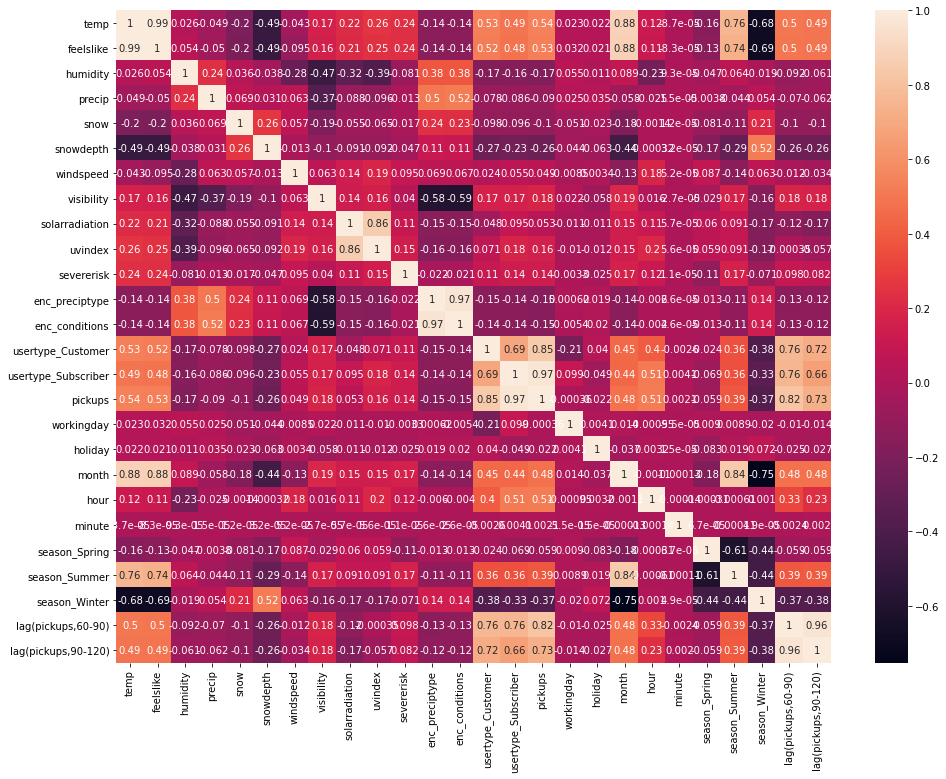

In [391]:
plt.figure(figsize=(16,12))
sns.heatmap(picksup.corr(), annot=True)

/home/georgep/anaconda3/envs/MachineLearning/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='pickups', ylabel='Density'>

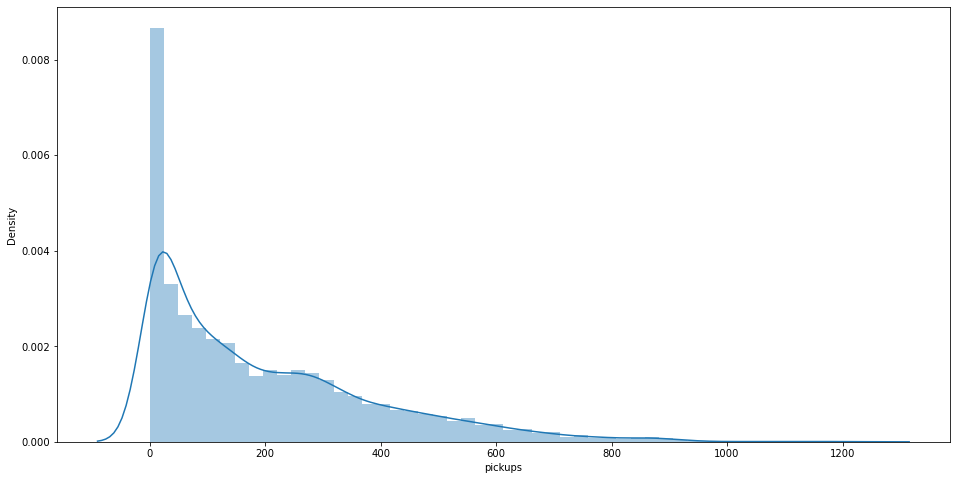

In [392]:
plt.figure(figsize=(16,8))
sns.distplot(picksup['pickups'])

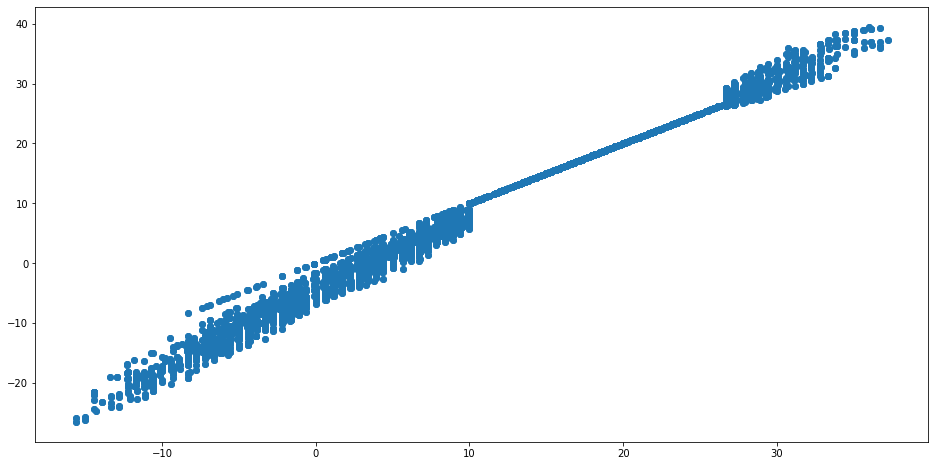

In [393]:
plt.figure(figsize=(16,8))
plt.scatter(picksup['temp'],picksup['feelslike'])

In [394]:
def scatter_plot():
    for i in picksup.columns:
        plt.scatter(picksup[i],picksup['pickups'])
        plt.title(f"Scatter plot for {i}")
        plt.show()

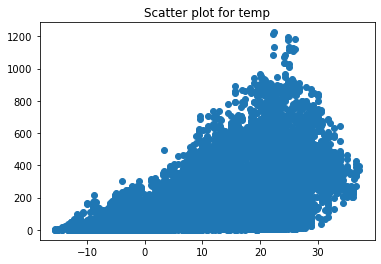

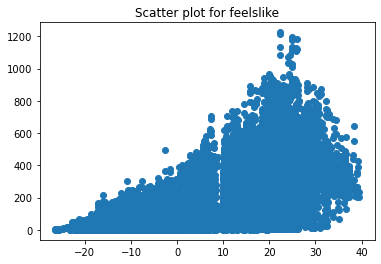

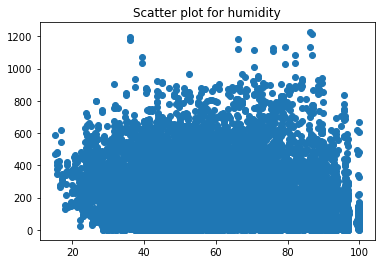

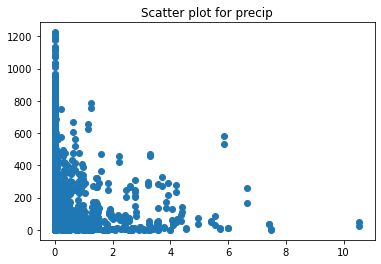

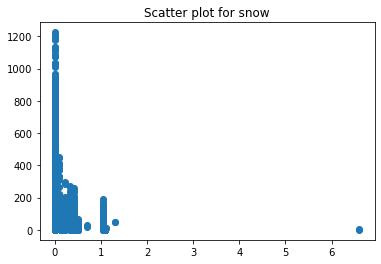

...

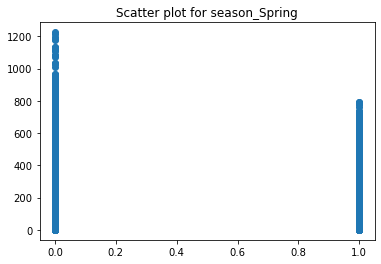

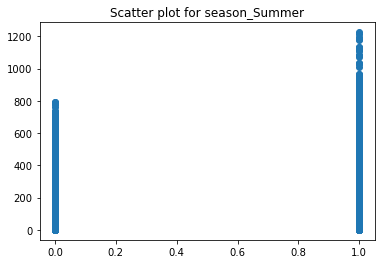

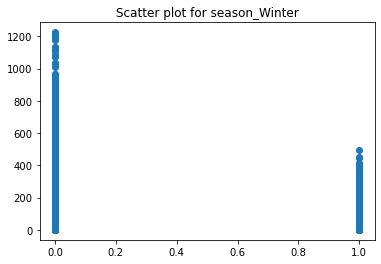

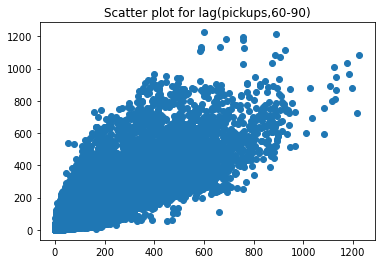

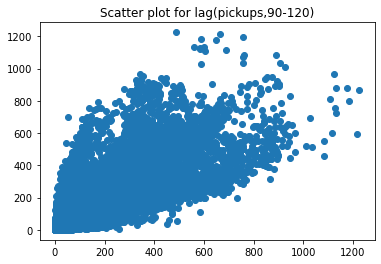

In [395]:
scatter_plot()

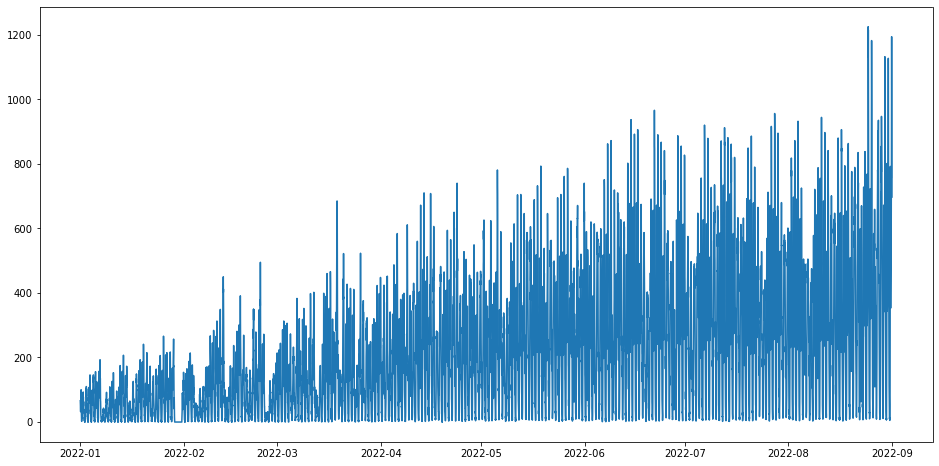

In [396]:
plt.figure(figsize=(16,8))
plt.plot(df30["pickups"])
plt.show()

<AxesSubplot:xlabel='hour', ylabel='pickups'>

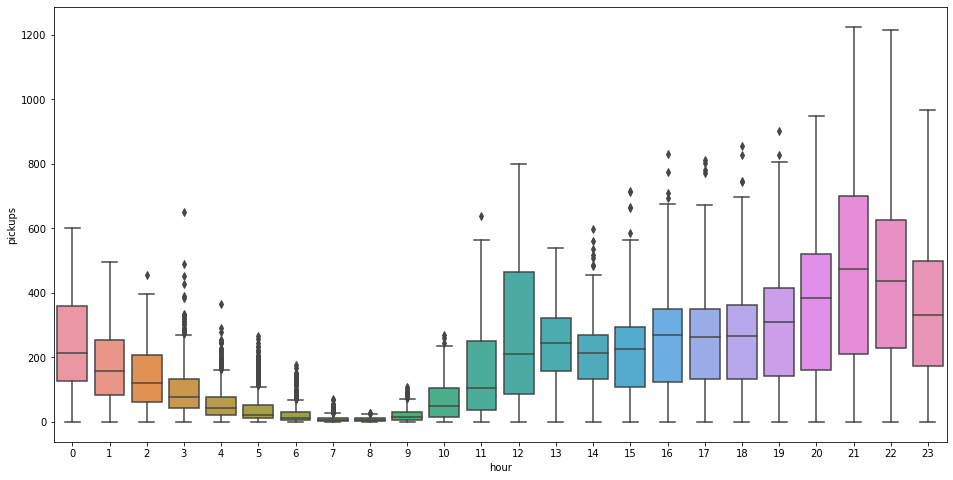

In [397]:
plt.figure(figsize=(16,8))
sns.boxplot(x='hour',y='pickups', data=picksup)

<AxesSubplot:xlabel='month', ylabel='pickups'>

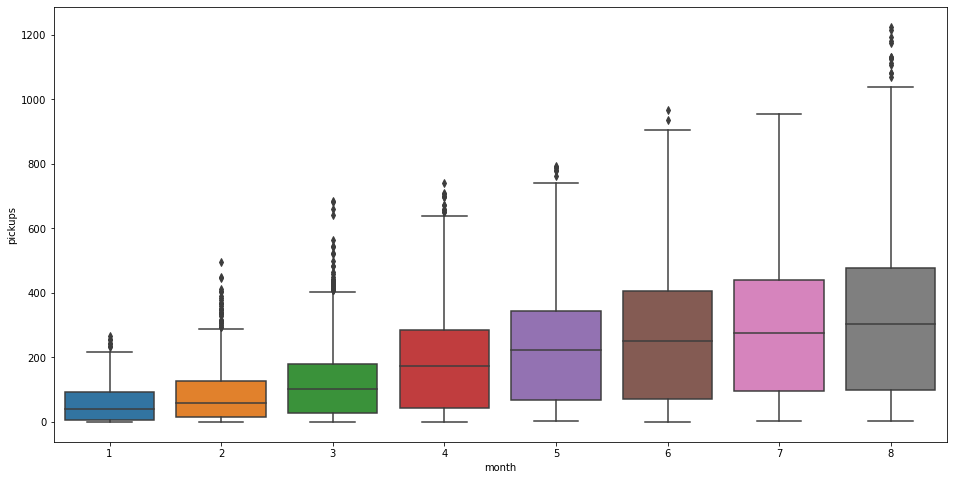

In [398]:
plt.figure(figsize=(16,8))
sns.boxplot(x='month',y='pickups', data=picksup)

<Figure size 1152x576 with 0 Axes>

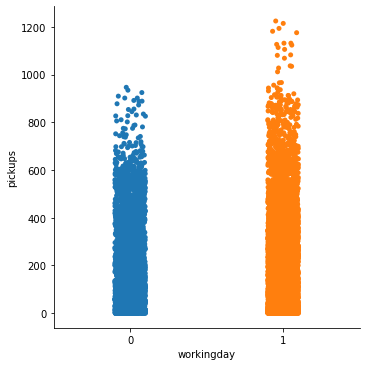

In [399]:
plt.figure(figsize=(16,8))
sns.catplot(data=picksup, x='workingday', y='pickups')

<Figure size 1152x576 with 0 Axes>

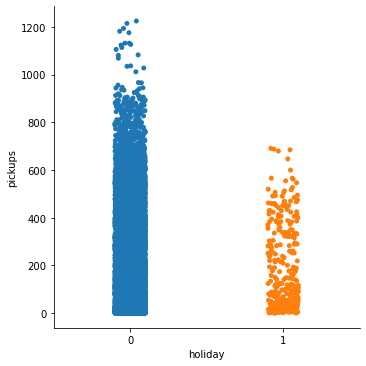

In [400]:
plt.figure(figsize=(16,8))
sns.catplot(data=picksup, x='holiday', y='pickups')

<AxesSubplot:xlabel='enc_conditions', ylabel='pickups'>

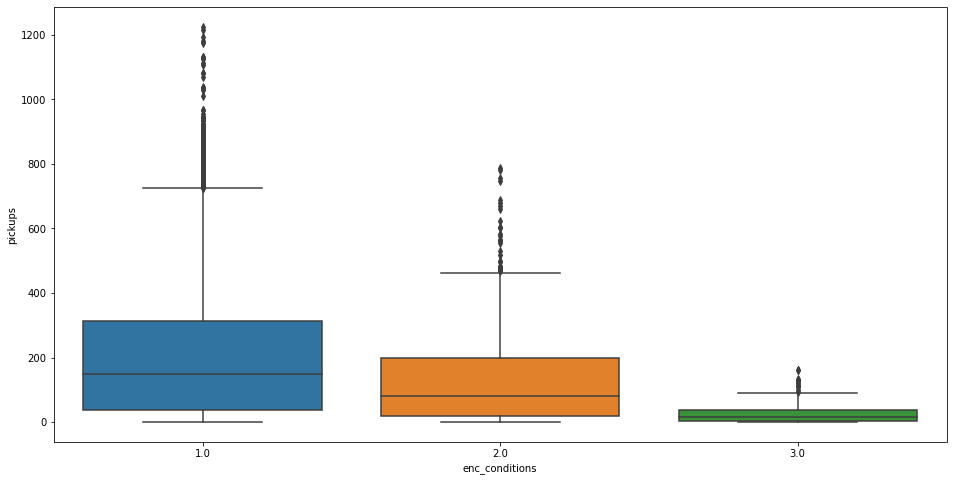

In [401]:
plt.figure(figsize=(16,8))
sns.boxplot(data=picksup, x='enc_conditions', y='pickups')

## Prediction

In [67]:
%reload_ext autoreload

In [554]:
for picks in [picksup15,picksup30,picksup60,picksup120]:
    picks.drop(['usertype_Customer','usertype_Subscriber','severerisk','solarradiation','snow','minute'], axis=1, inplace=True)
    picks[['enc_preciptype', 'enc_conditions','workingday', 'holiday','season_Spring', 'season_Summer',
       'season_Winter','month', 'hour']] = picks[['enc_preciptype', 'enc_conditions','workingday', 'holiday','season_Spring', 'season_Summer',
       'season_Winter','month', 'hour']].astype('category')

In [555]:
picksup15.columns

Index(['temp', 'feelslike', 'humidity', 'precip', 'snowdepth', 'windspeed',
       'visibility', 'uvindex', 'enc_preciptype', 'enc_conditions', 'pickups',
       'workingday', 'holiday', 'month', 'hour', 'season_Spring',
       'season_Summer', 'season_Winter', 'lag(pickups,60-75)',
       'lag(pickups,75-90)', 'lag(pickups,90-105)', 'lag(pickups,105-120)'],
      dtype='object')

In [556]:
picks.head()

,temp,feelslike,humidity,precip,snowdepth,windspeed,visibility,uvindex,enc_preciptype,enc_conditions,pickups,workingday,holiday,month,hour,season_Spring,season_Summer,season_Winter,"lag(pickups,0-120)"
1,7.20,6.6,96.545,0.0000,0.0,3.7,2.50,0.0,0.0,1.0,168.0,0,1,1,2,0,0,1,217.0
2,6.80,5.2,99.820,0.0000,0.0,8.2,0.00,0.0,0.0,1.0,215.0,0,1,1,4,0,0,1,168.0
3,7.05,5.8,99.680,0.0000,0.0,7.1,0.10,0.0,0.0,1.0,283.0,0,1,1,6,0,0,1,215.0
4,7.90,6.3,99.790,0.0000,0.0,9.2,0.05,0.0,0.0,1.0,56.0,0,1,1,8,0,0,1,283.0
5,7.90,6.7,99.770,0.0025,0.0,7.6,3.05,0.0,1.0,1.5,47.0,0,1,1,10,0,0,1,56.0


In [557]:
def ModelRunningResults(models,models_name, first_row, picks,weather_columns):
    results = {}
    table = [first_row]
    pipe = main.PredictionPipeline(picks, weather_columns)
    X_train, X_test, y_train, y_test = pipe.PredictionDataPreperation()
    for model, model_name in zip(models,models_name):
        CV_score, CV_MSE, test_score, test_MSE = pipe.BackTestingPrediction(model, model_name, X_train, X_test, y_train, y_test)
        results[model_name] = {'Cross Validation Score': CV_score, 'Cross Validation MSE': CV_MSE, 'Test Score':test_score, 'Test MSE':test_MSE}
        row = [model_name, np.max(CV_score), np.min(CV_MSE), test_score, test_MSE]
        table.append(row)      

    return table

In [558]:
models = [LinearRegression(),Ridge(),Lasso(),RandomForestRegressor(),ExtraTreesRegressor()]
models_name = ['LinearRegression','RidgeRegression','LassoRegression','RandomForestRegressor','ExtraTreesRegressor']
first_row = ['Model','OptimalCrossValScore','OptimalCrossValMSE','TestScore','TestMSE']
weather_columns = ['feelslike', 'humidity', 'precip', 'snowdepth','windspeed', 'visibility', 'uvindex',]
print('The Prediction based on {} minutes intervals \n'.format(15))
table = ModelRunningResults(models,models_name, first_row, picksup15,weather_columns)

The Prediction based on 15 minutes intervals 


 LinearRegression

CV Train Score:  0.796059894636124
CV Train RMSE :  12.07914536879061
CV Score:     0.7718762893752945
CV MSE :     19.363083130216275

CV Train Score:  0.7989541943800349
CV Train RMSE :  15.552490072274319
CV Score:     0.7271627567570678
CV MSE :     29.22728102414404

CV Train Score:  0.7834670983954588
CV Train RMSE :  21.002150806771652
CV Score:     0.7622951811890694
CV MSE :     38.244943975652

CV Train Score:  0.809750979763758
CV Train RMSE :  26.06698056732667
CV Score:     0.758050256780581
CV MSE :     45.08916974245821

CV Train Score:  0.8169668685522148
CV Train RMSE :  30.79478945982806
CV Score:     0.7227006621728633
CV MSE :     56.760379864836366

CV Train Score:  0.8084744562393674
CV Train RMSE :  36.22081834245063
CV Score:     0.7340454019173575
CV MSE :     55.29413636773363

Train Score:  0.8067548278312188
Train RMSE :  39.45065517105525
Test Score:  0.745717531413114
Test MSE :    64.37483

In [559]:
print(tabulate(table, headers='firstrow',colalign=("left",), floatfmt=".4f"))

Model                    OptimalCrossValScore    OptimalCrossValMSE    TestScore    TestMSE
---------------------  ----------------------  --------------------  -----------  ---------
LinearRegression                       0.7719               19.3631       0.7457    64.3748
RidgeRegression                        0.7715               19.3777       0.7457    64.3778
LassoRegression                        0.7418               21.3352       0.7321    66.0792
RandomForestRegressor                  0.9249               19.0956       0.8546    48.6768
ExtraTreesRegressor                    0.9329               20.4958       0.8615    47.5122


In [560]:
models = [LinearRegression(),Ridge(),Lasso(),RandomForestRegressor(),ExtraTreesRegressor()]
models_name = ['LinearRegression','RidgeRegression','LassoRegression','RandomForestRegressor','ExtraTreesRegressor']
first_row = ['Model','OptimalCrossValScore','OptimalCrossValMSE','TestScore','TestMSE']
weather_columns = ['feelslike', 'humidity', 'precip', 'snowdepth','windspeed', 'visibility', 'uvindex',]
print('The Prediction based on {} minutes intervals \n'.format(30))
table = ModelRunningResults(models,models_name, first_row, picksup30,weather_columns)
print('\n\n',tabulate(table, headers='firstrow',colalign=("left",), floatfmt=".4f"))

The Prediction based on 30 minutes intervals 


 LinearRegression

CV Train Score:  0.7909774089988412
CV Train RMSE :  24.186310920669012
CV Score:     0.7571217682805034
CV MSE :     39.587093245986296

CV Train Score:  0.7906462402413419
CV Train RMSE :  31.439670746518555
CV Score:     0.6996274193953236
CV MSE :     60.880292712931876

CV Train Score:  0.7673235360136146
CV Train RMSE :  43.211617398205874
CV Score:     0.7342519930140086
CV MSE :     80.33510944756968

CV Train Score:  0.7923608049854884
CV Train RMSE :  54.13101729857782
CV Score:     0.7307659998924074
CV MSE :     94.49325134867321

CV Train Score:  0.7992447432234883
CV Train RMSE :  64.1429578114033
CV Score:     0.6861146360422201
CV MSE :     120.02479398051366

CV Train Score:  0.7877717885646559
CV Train RMSE :  75.85474001844509
CV Score:     0.6973129464729181
CV MSE :     117.2509613228721

Train Score:  0.7846048884102181
Train RMSE :  82.87476945018219
Test Score:  0.7110644876882111
Test MSE :    1

In [ ]:
models = [LinearRegression(),Ridge(),Lasso(),RandomForestRegressor(),ExtraTreesRegressor()]
models_name = ['LinearRegression','RidgeRegression','LassoRegression','RandomForestRegressor','ExtraTreesRegressor']
first_row = ['Model','OptimalCrossValScore','OptimalCrossValMSE','TestScore','TestMSE']
weather_columns = ['feelslike', 'humidity', 'precip', 'snowdepth','windspeed', 'visibility', 'uvindex',]
print('The Prediction based on {} minutes intervals \n'.format(60))
table = ModelRunningResults(models,models_name, first_row, picksup60,weather_columns)
print('\n\n',tabulate(table, headers='firstrow',colalign=("left",), floatfmt=".4f"))

In [ ]:
models = [LinearRegression(),Ridge(),Lasso(),RandomForestRegressor(),ExtraTreesRegressor()]
models_name = ['LinearRegression','RidgeRegression','LassoRegression','RandomForestRegressor','ExtraTreesRegressor']
first_row = ['Model','OptimalCrossValScore','OptimalCrossValMSE','TestScore','TestMSE']
weather_columns = ['feelslike', 'humidity', 'precip', 'snowdepth','windspeed', 'visibility', 'uvindex',]
print('The Prediction based on {} minutes intervals \n'.format(120))
table = ModelRunningResults(models,models_name, first_row, picksup120,weather_columns)
print('\n\n',tabulate(table, headers='firstrow',colalign=("left",), floatfmt=".4f"))

In [456]:
print(tabulate(table, headers='firstrow',colalign=("left",), floatfmt=".4f"))

Model                    OptimalCrossValScore    OptimalCrossValMSE    OptimalTestScore    OptimalTestMSE
---------------------  ----------------------  --------------------  ------------------  ----------------
LinearRegression                       0.7728               19.3229              0.7458           64.3700
RidgeRegression                        0.7727               19.3274              0.7457           64.3729
LassoRegression                        0.7406               22.0321              0.7347           65.7587
RandomForestRegressor                  0.9290               18.8359              0.8623           47.3715
ExtraTreesRegressor                    0.9404               20.5703              0.8725           45.5860


# Part 2. Stations Clustering

In [151]:
%reload_ext autoreload

In [137]:
clustering_data = pd.read_csv('BikeSharing_Bluebikes2022.csv', index_col=0)

/home/georgep/anaconda3/envs/MachineLearning/lib/python3.8/site-packages/numpy/lib/arraysetops.py:580: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



In [138]:
#transforming the dates from object to datetime
for date_column in ['starttime','stoptime']:
    clustering_data[date_column] = pd.to_datetime(clustering_data[date_column], format='%Y-%m-%d %H:%M:%S')

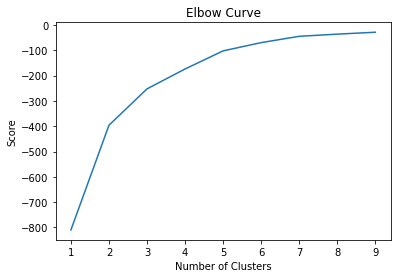

In [33]:
# creates 5 clusters using hierarchical clustering.
#agc = AgglomerativeClustering(n_clusters =5, affinity='euclidean', linkage='ward')
#train['pickup cluster'] = agc.fit_predict(train)

K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = np.array(data.loc[:,'start station latitude']).reshape(-1,1)
X_axis = np.array(data.loc[:,'start station longitude']).reshape(-1,1)
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [141]:
# creates 5 clusters using k-means clustering algorithm.
kmeans = KMeans(n_clusters = 5, init ='k-means++')
kmeans.fit(clustering_data.loc[:,['start station latitude','start station longitude']]) # Compute k-means clustering.
clustering_data['cluster_label'] = kmeans.fit_predict(clustering_data.loc[:,['start station latitude','start station longitude']])
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(clustering_data.loc[:,['start station latitude','start station longitude']]) # Labels of each point

In [142]:
clustering_data = clustering_data.join(clustering_data.groupby(['start station latitude','start station longitude']).count()['cluster_label'], on=['start station latitude','start station longitude'], lsuffix='', rsuffix='count')

In [143]:
clustering_data.head()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,postal code,cluster_label,cluster_labelcount
0,597,2022-01-01 00:00:25.166,2022-01-01 00:10:22.192,178,MIT Pacific St at Purrington St,42.359573,-71.101295,74,Harvard Square at Mass Ave/ Dunster,42.373268,-71.118579,4923,Subscriber,02139,1,28026
1,411,2022-01-01 00:00:40.430,2022-01-01 00:07:32.198,189,Kendall T,42.362428,-71.084955,178,MIT Pacific St at Purrington St,42.359573,-71.101295,3112,Subscriber,02139,1,15489
2,476,2022-01-01 00:00:54.818,2022-01-01 00:08:51.668,94,Main St at Austin St,42.375603,-71.064608,356,Charlestown Navy Yard,42.374125,-71.054812,6901,Customer,02124,3,4502
3,466,2022-01-01 00:01:01.608,2022-01-01 00:08:48.235,94,Main St at Austin St,42.375603,-71.064608,356,Charlestown Navy Yard,42.374125,-71.054812,5214,Customer,02124,3,4502
4,752,2022-01-01 00:01:06.052,2022-01-01 00:13:38.230,19,Park Dr at Buswell St,42.347241,-71.105301,41,Packard's Corner - Commonwealth Ave at Brighto...,42.352261,-71.123831,2214,Subscriber,02215,0,7362


In [144]:
clustering_data.columns

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'postal code', 'cluster_label', 'cluster_labelcount'],
      dtype='object')

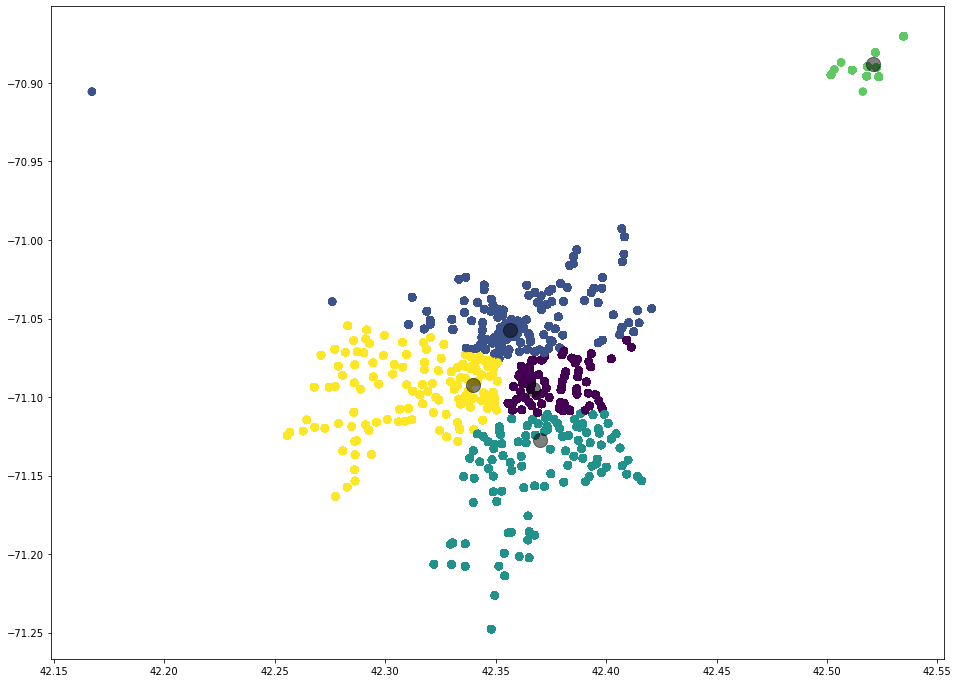

In [56]:
plt.figure(figsize=(16,12))
plt.scatter(x = 'start station latitude', y = 'start station longitude', data=data, c=labels, s=50)
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

In [60]:
plt.figure(figsize=(16,12))
main.get_location_interactive(data[['start station latitude','start station longitude','cluster_label', 'cluster_labelcount']].sample(n=100000))

<Figure size 1152x864 with 0 Axes>

In [152]:
cdf15 = main.ClusterDatetimeInterval(clustering_data, freq='15Min')
cdf30 = main.ClusterDatetimeInterval(clustering_data, freq='30Min')
cdf60 = main.ClusterDatetimeInterval(clustering_data, freq='60Min')
cdf120 = main.ClusterDatetimeInterval(clustering_data, freq='120Min')

AttributeError: module 'main' has no attribute 'ClusterDatetimeInterval'

In [135]:
cdf15.head()

,usertype_Customer,usertype_Subscriber,pickups
starttime,,,
2022-01-01 00:00:00,7.0,23.0,30.0
2022-01-01 00:15:00,6.0,30.0,36.0
2022-01-01 00:30:00,7.0,22.0,29.0
2022-01-01 00:45:00,8.0,22.0,30.0
2022-01-01 01:00:00,5.0,16.0,21.0


In [94]:
df1 = pd.get_dummies(data, columns=['usertype','cluster_label'])
df1 = df1.set_index('starttime')

In [95]:
df1 = df1.resample(rule='15Min', label='left', origin='start_day').sum()

In [97]:
clasterpickups = df1.iloc[:,-7:]

In [98]:
clasterpickups.head()

,usertype_Customer,usertype_Subscriber,cluster_label_0,cluster_label_1,cluster_label_2,cluster_label_3,cluster_label_4
starttime,,,,,,,
2022-01-01 00:00:00,7.0,23.0,9.0,12.0,6.0,3.0,0.0
2022-01-01 00:15:00,6.0,30.0,12.0,14.0,8.0,2.0,0.0
2022-01-01 00:30:00,7.0,22.0,11.0,10.0,4.0,4.0,0.0
2022-01-01 00:45:00,8.0,22.0,7.0,11.0,6.0,6.0,0.0
2022-01-01 01:00:00,5.0,16.0,4.0,8.0,6.0,3.0,0.0


In [99]:
clasterpickups['pickups'] = clasterpickups.loc[:,['usertype_Customer','usertype_Subscriber']].sum(axis=1)

In [100]:
cluster_pickups = pd.DataFrame(clasterpickups)
cluster_pickups.head()

,usertype_Customer,usertype_Subscriber,cluster_label_0,cluster_label_1,cluster_label_2,cluster_label_3,cluster_label_4,pickups
starttime,,,,,,,,
2022-01-01 00:00:00,7.0,23.0,9.0,12.0,6.0,3.0,0.0,30.0
2022-01-01 00:15:00,6.0,30.0,12.0,14.0,8.0,2.0,0.0,36.0
2022-01-01 00:30:00,7.0,22.0,11.0,10.0,4.0,4.0,0.0,29.0
2022-01-01 00:45:00,8.0,22.0,7.0,11.0,6.0,6.0,0.0,30.0
2022-01-01 01:00:00,5.0,16.0,4.0,8.0,6.0,3.0,0.0,21.0


In [82]:
df15 = main.DatetimeInterval(data, freq='15Min')
df30 = main.DatetimeInterval(data, freq='30Min')
df60 = main.DatetimeInterval(data, freq='60Min')
df120 = main.DatetimeInterval(data, freq='120Min')

In [83]:
df120.head()

,usertype_Customer,usertype_Subscriber,pickups
starttime,,,
2022-01-01 00:00:00,59.0,158.0,217.0
2022-01-01 02:00:00,86.0,82.0,168.0
2022-01-01 04:00:00,111.0,104.0,215.0
2022-01-01 06:00:00,189.0,94.0,283.0
2022-01-01 08:00:00,38.0,18.0,56.0


In [66]:
cluster_pickups

,usertype_Customer,usertype_Subscriber,cluster_label_0,cluster_label_1,cluster_label_2,cluster_label_3,cluster_label_4,pickups
starttime,,,,,,,,
2022-01-01 00:00:00,7.0,23.0,9.0,11.0,3.0,0.0,7.0,30.0
2022-01-01 00:15:00,6.0,30.0,12.0,14.0,2.0,0.0,8.0,36.0
2022-01-01 00:30:00,7.0,22.0,11.0,10.0,4.0,0.0,4.0,29.0
2022-01-01 00:45:00,8.0,22.0,7.0,10.0,8.0,0.0,5.0,30.0
2022-01-01 01:00:00,5.0,16.0,4.0,8.0,3.0,0.0,6.0,21.0
...,...,...,...,...,...,...,...,...
2022-08-31 22:45:00,52.0,488.0,119.0,146.0,138.0,0.0,137.0,540.0
2022-08-31 23:00:00,52.0,406.0,112.0,132.0,108.0,0.0,106.0,458.0
2022-08-31 23:15:00,43.0,377.0,102.0,90.0,93.0,2.0,133.0,420.0
